In [6]:
import numpy as np
import h5py
from IPython.display import Image
import glob

import matplotlib
import matplotlib.image as mpimg
from matplotlib import pyplot as plt
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 8),
         'axes.labelsize': 'x-large',
         'axes.titlesize': 'x-large',
         'xtick.labelsize': 'large',
         'ytick.labelsize': 'large'}
%matplotlib inline
pylab.rcParams.update(params)

In [33]:
base_dir = '/scratch/ksf293/anomalies'
plot_dir = '/home/ksf293/anomalies-GAN-HSC/plots/plots_2021-05-10'

In [22]:
imtag = 'gri'
tag = 'gri_lambda0.3'
base_dir = '/scratch/ksf293/anomalies'
imarr_fn = f'{base_dir}/data/images_h5/images_{imtag}.h5'
imarr = h5py.File(imarr_fn, 'r')
results_fn = f'{base_dir}/results/results_{tag}.h5'
res = h5py.File(results_fn, 'r')

In [23]:
gen_scores = res['gen_scores_sigma'][:]
disc_scores = res['disc_scores_sigma'][:]
scores = res['anomaly_scores_sigma'][:]
idxs = res['idxs'][:]
print(len(idxs))

942781


In [24]:
tag = 'gri'
imdict_fn = f'{base_dir}/data/idxdicts_h5/idx2imloc_{tag}.npy'
resdict_fn = f'{base_dir}/data/idxdicts_h5/idx2resloc_{tag}.npy'
idx2imloc = np.load(imdict_fn, allow_pickle=True).item()
idx2resloc = np.load(resdict_fn, allow_pickle=True).item()

In [25]:
from astropy.visualization import make_lupton_rgb
def luptonize(x, rgb_q=15, rgb_stretch=0.5, rgb_min=0):
    if x.ndim==3:
        x = make_lupton_rgb(x[:,:,2], x[:,:,1], x[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
    elif x.ndim==4:
        x = np.array([make_lupton_rgb(xi[:,:,2], xi[:,:,1], xi[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
                      for xi in x])
    else:
        raise ValueError(f"Wrong number of dimensions! Gave {x.ndim}, need 3 or 4")
    return x

In [26]:
def plot_ims(ids, nrows, ncols, saveto=None, headers=None, tight=False):
    assert len(ids)<=nrows*ncols, "bad rows/cols for number of ids!"
        
    subsize = 2
    fig, axarr = plt.subplots(nrows,ncols,figsize=(ncols*subsize,nrows*subsize))
    if tight:
        plt.subplots_adjust(hspace=0.03, wspace=-0.15)
    else:
        plt.subplots_adjust(hspace=0.2, wspace=0.05)
    plt.rc('text', usetex=True)
    
    count = 0
    for i in range(nrows):
        for j in range(ncols):
            idx = ids[count]
            loc = idx2imloc[idx]
            im = imarr['images'][loc]
            obj_id = int(imarr['object_ids'][loc])
            if nrows==1 and ncols==1:
                ax = axarr
            elif nrows==1:
                ax = axarr[j]
            elif ncols==1:
                ax = axarr[i]
            else:
                ax = axarr[i][j]
                
            if not tight:
                title = f"ID: {obj_id}"
                ax.set_title(title, fontsize=8)
            
            ax.imshow(luptonize(im))
            ax.set_xticks([])
            ax.set_yticks([])
            
            if headers is not None and i==0:
                # units are pixel values;
                nside = 96
                ax.text(nside/2,-nside/4,headers[j], size=16, horizontalalignment='center')
                
            count += 1
            if count>=len(ids):
                break
                
        if count>=len(ids):
            break
                
    if saveto:
        plt.savefig(saveto, bbox_inches='tight')#, pad_inches=0)

In [27]:
nrows = 6
ncols = 10
nplot = nrows*ncols

65831


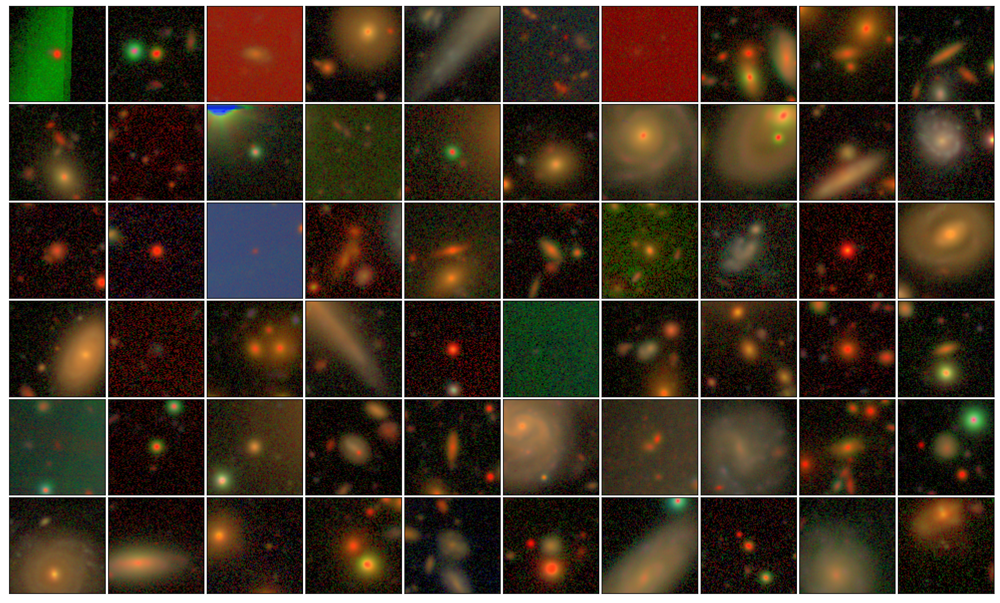

In [28]:
# 1.5 sig disc 
np.random.seed(42)
locs = np.where((disc_scores > 1.5))[0]
print(len(locs))
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

38188


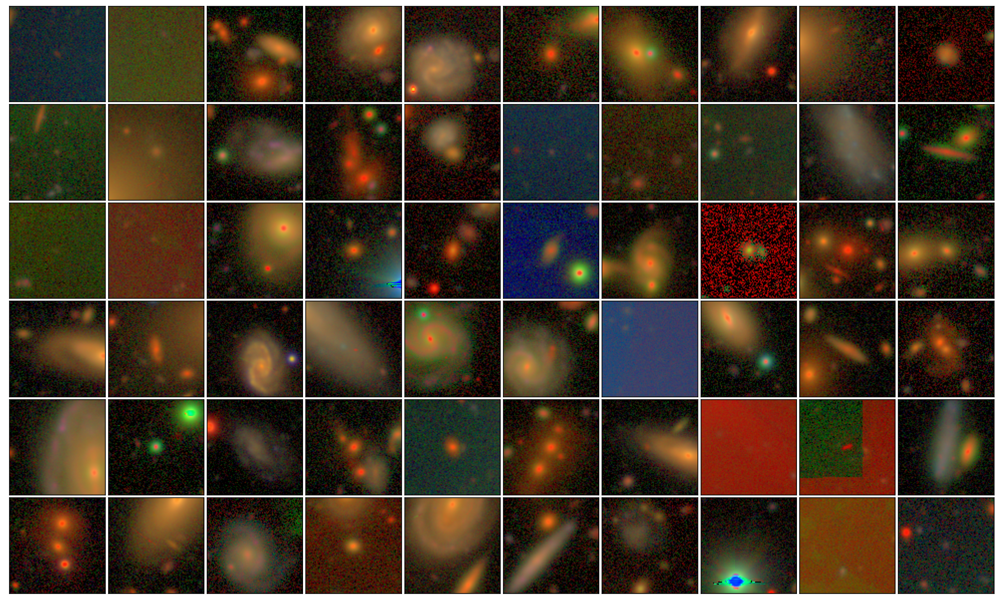

In [31]:
# 1.5 sig disc 
np.random.seed(42)
locs = np.where((disc_scores > 2))[0]
print(len(locs))
idxs_sub = [idxs[loc] for loc in locs]
idxs_sub = np.random.choice(idxs_sub, nplot, replace=False)
plot_ims(idxs_sub, nrows, ncols, tight=True)

In [29]:
tag = 'gri_lambda0.3_1.5sigd'

base_dir = '/scratch/ksf293/anomalies'

print(f"Loading and results with tag {tag}")
results_anoms_fn = f'{base_dir}/results/results_{tag}.h5'
res_anoms = h5py.File(results_anoms_fn, 'r')

Loading and results with tag gri_lambda0.3_1.5sigd


In [30]:
len(res_anoms['idxs'])

65831

## SDSS color cutout comparison

Cutout list to paste into query at https://skyserver.sdss.org/dr14/en/tools/chart/list.aspx:

    name        ra     dec  
    idx22 216.563697631386,1.4929663871282497
    idx1497 330.8972743406692,2.1688695758025736
    idx2172 330.4923522847649,1.6874329214018784
    idx3731 331.83403102635816,1.9602733594109616
    idx18395 335.8196236835816,2.6536759601735294
    idx19627 338.3263794490667,1.9031856570548409
    idx461522 146.0072412041349,-0.6407247527745553
    idx491798 179.85053355084278,-1.1549830058103594
    idx493703 179.2809401755828,-0.8024976871021088


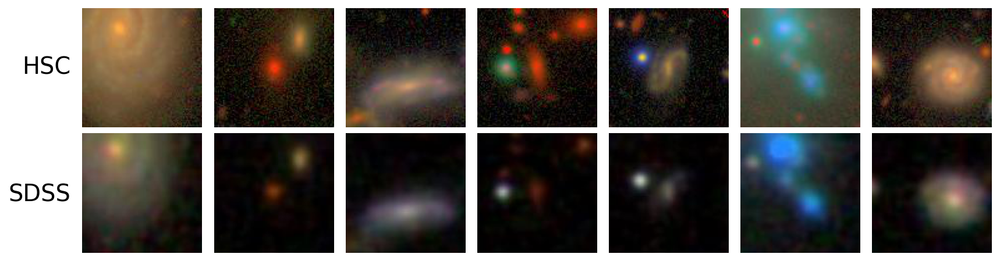

In [43]:
#idxs_cutouts = [22, 1497, 2172, 3731, 18395, 19627, 461522, 491798, 493703]
idxs_cutouts = [22, 1497, 3731, 18395, 19627, 461522, 493703]

n_cutouts = len(idxs_cutouts)
dir_hsc = '/scratch/ksf293/anomalies/thumbnails/thumbnails_galaxyzoo_gri_lambda0.3_1.5sigd'
dir_sdss = '/scratch/ksf293/anomalies/thumbnails/galaxy_zoo_sdss_cutouts'

subsize = 2
fig, axarr = plt.subplots(2,n_cutouts,figsize=(subsize*n_cutouts, subsize*2))
plt.subplots_adjust(hspace=-0.02, wspace=0.1)
for i in range(n_cutouts):
    idx = idxs_cutouts[i]
    for name in glob.glob(f'{dir_hsc}/thumbnail_idx{idx}_*.jpg'):
        im_hsc = mpimg.imread(name)
        break #should only be one for a given idx!
    im_sdss = mpimg.imread(f'{dir_sdss}/sdss_idx{idx}.jpg')
    
    axarr[0][i].imshow(im_hsc)
    axarr[1][i].imshow(im_sdss, origin='lower')
    
    axarr[0][i].axis('off')
    axarr[1][i].axis('off')
    
fig.text(0.115, 0.69, 'HSC', fontsize=20, ha='right', va='center')
fig.text(0.115, 0.31, 'SDSS', fontsize=20, ha='right', va='center')

plt.savefig(f'{plot_dir}/sdss_hsc_cutout_comparison.png', bbox_inches='tight')